In [1]:
from dataclasses import dataclass
import torch
import numpy as np
import time
import json
import random
import requests
from PIL import Image
from io import BytesIO
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
from pathlib import Path
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pytorch_fid import fid_score
import ssl

**README**

The notebook is divided into the 9 parts seen below. 

If you wish to run the notebook, you should download the *diffusion_trainingpoints.json* file, which can be found in my github repository. Remember to change the corresponding directory in the dataloader so the .json file gets loaded correctly. Furthermore, this .ipynb file is set up to be ran on GPU.

My model was running for 15 epochs on GPU with a batch size of 16. One epoch took approximately 6 hours if there were no problems with the API. I have left my username and password for the API in case you wish to run the .ipynb file. If you wish to create your own profile for the API, you can use the link below:

https://datafordeler.dk/dataoversigt/geodanmark-ortofoto/ortofoto-foraar-wms/

Cell outputs are saved for some of the figures and for the FID score. I have also saved a "KeyboardInterrupt" cell output for part "7) Training" just to illustrate that the model actually runs...

**1) General configurations**

**2) Data loader**

**3) Noise scheduler**

**4) Positional encoding**

**5) U-Net**

**6) Postprocess function**

**7) Training**

**8) Sampling and creating figures**

**9) FID**


## 1) General configurations 

In [3]:
@dataclass
class TrainingConfig:
    image_size = 256
    image_channels = 3
    train_batch_size = 2
    eval_batch_size = 5
    num_epochs = 15
    start_epoch = 0
    learning_rate = 2e-5
    diffusion_timesteps = 1000
    save_image_epochs = 1
    save_model_epochs = 1
    output_dir = "../../train/casper/output/"
    device = "cuda"
    seed = 24
    resume = None
training_config = TrainingConfig()

## 2) Data loader

In [4]:
########## DOWNLOAD AND CHANGE DIRECTORY FOR .JSON FILE, IF YOU WISH TO RUN .IPYNB FILE ##########

shared_dir = '..'
with open(f'{shared_dir}/datascripts/diffusion_trainingpoints.json', 'r') as file:
    diffusionpoints = json.load(file)

########## DOWNLOAD AND CHANGE DIRECTORY FOR .JSON FILE, IF YOU WISH TO RUN .IPYNB FILE ##########

def get_orto(xmin, ymin):
    pixel_size = 256
    xmax = xmin + 128
    ymax = ymin + 128
    year = np.random.randint(2016,2024)
    
    username = "DNBZJQDZJQ"
    password = "123dtU.456"

    wms_url = "https://services.datafordeler.dk/GeoDanmarkOrto/orto_foraar/1.0.0/WMS"
    wms_request_url = f"{wms_url}?username={username}&password={password}&SERVICE=WMS&VERSION=1.3.0&REQUEST=GetMap&BBOX={xmin},{ymin},{xmax},{ymax}&CRS=EPSG:25832&WIDTH={pixel_size}&HEIGHT={pixel_size}&STYLES=&FORMAT=image/png&DPI=96&MAP_RESOLUTION=96&FORMAT_OPTIONS=dpi:96&Layers=geodanmark_{year}_12_5cm"
    
    # Due to API unreliability, retries the request up to 'max_attempts' times with a 10-second delay.
    # Re-raises the exception if all attempts fail.
    max_attempts = 10
    attempts = 0
    while attempts < max_attempts:
        try:
            response = requests.get(wms_request_url)
            img = Image.open(BytesIO(response.content))
            break
        except:
            attempts += 1
            if attempts < max_attempts:
                time.sleep(10)  # Wait before retrying
            else:
                raise  # Re-raise the exception after the final attempt
    return img

class CoordinateDataset(Dataset):
    def __init__(self, coordinates, transform=None):
        self.coordinates = coordinates
        self.transform = transform

    def __len__(self):
        return len(self.coordinates)

    def __getitem__(self, idx):
        xmin, ymin = self.coordinates[idx]
        image = get_orto(xmin, ymin)

        if self.transform:
            image = self.transform(image)

        return {"images": image}

def get_loader(config):
    coordinates = diffusionpoints['koordinates']
    preprocess = transforms.Compose(
        [
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ]
    )

    dataset = CoordinateDataset(coordinates, transform=preprocess)
    loader = DataLoader(dataset, batch_size=config.train_batch_size, shuffle=True, num_workers = 1) #In reality I used 4 num_workers

    return loader

## 3) Noise scheduler

In [5]:
# Reshapes the values tensor to match the broadcast_to tensor's dimensions
def broadcast(values, broadcast_to):
    values = values.flatten()
    while len(values.shape) < len(broadcast_to.shape):
        values = values.unsqueeze(-1)
    return values

class DDPMPipeline:
    def __init__(self, beta_start=1e-4, beta_end=1e-2, num_timesteps=1000): # T=1000, b1=0.0001 and bT=0.01 
        self.betas = torch.linspace(beta_start, beta_end, num_timesteps)
        self.alphas = 1 - self.betas
        self.alphas_hat = torch.cumprod(self.alphas, dim=0) # Precompute alpha-hat
        self.device = 'cuda'
        self.alphas_hat = self.alphas_hat.to(self.device)
        self.num_timesteps = num_timesteps

    def forward_diffusion(self, images, timesteps) -> tuple[torch.Tensor, torch.Tensor]:
        # Ensure that input tensors are on same device
        images = images.to(self.device)
        timesteps = timesteps.to(self.device)
        gaussian_noise = torch.randn(images.shape).to(images.device)
        alpha_hat = self.alphas_hat[timesteps].to(images.device)
        alpha_hat = broadcast(alpha_hat, images)
        return torch.sqrt(alpha_hat) * images + torch.sqrt(1 - alpha_hat) * gaussian_noise, gaussian_noise

    def reverse_diffusion(self, model, noisy_images, timesteps):
        predicted_noise = model(noisy_images, timesteps)
        return predicted_noise

    @torch.no_grad()
    def sampling(self, model, initial_noise, device, save_all_steps=False):
        image = initial_noise
        images = []
        for timestep in tqdm(range(self.num_timesteps - 1, -1, -1)):
            ts = timestep * torch.ones(image.shape[0], dtype=torch.long, device=device)
            predicted_noise = model(image, ts)
            beta_t = self.betas[timestep].to(device)
            alpha_t = self.alphas[timestep].to(device)
            alpha_hat = self.alphas_hat[timestep].to(device)

            # Calculating x_{t-1} with alphas and variance
            # By fixing x0 to one point, fixed variance can be applied as per the paper.
            alpha_hat_prev = self.alphas_hat[timestep - 1].to(device)
            beta_t_hat = (1 - alpha_hat_prev) / (1 - alpha_hat) * beta_t
            variance = torch.sqrt(beta_t_hat) * torch.randn(image.shape).to(device) if timestep > 0 else 0

            image = torch.pow(alpha_t, -0.5) * (image -
                                                beta_t / torch.sqrt((1 - alpha_hat_prev)) *
                                                predicted_noise) + variance
            if save_all_steps:
                images.append(image.cpu())
        return images if save_all_steps else image

## 4) Positional encoding

In [6]:
class TransformerPositionalEmbedding(nn.Module):
    """
    From paper "Attention Is All You Need", section 3.5
    """
    def __init__(self, dimension, max_timesteps=1000):
        super(TransformerPositionalEmbedding, self).__init__()
        assert dimension % 2 == 0, "Embedding dimension must be even"
        self.dimension = dimension
        self.pe_matrix = torch.zeros(max_timesteps, dimension).to(torch.device("cuda")) #Casper: rettet denne linje
        # Gather all the even dimensions across the embedding vector
        even_indices = torch.arange(0, self.dimension, 2)
        # Calculate the term using log transforms for faster calculations
        # (https://stackoverflow.com/questions/17891595/pow-vs-exp-performance)
        log_term = torch.log(torch.tensor(10000.0)) / self.dimension
        div_term = torch.exp(even_indices * -log_term)

        # Precompute positional encoding matrix based on odd/even timesteps
        timesteps = torch.arange(max_timesteps).unsqueeze(1)
        self.pe_matrix[:, 0::2] = torch.sin(timesteps * div_term)
        self.pe_matrix[:, 1::2] = torch.cos(timesteps * div_term)

    def forward(self, timestep):
        # [bs, d_model]
        return self.pe_matrix[timestep].to(timestep.device)

## 5) U-Net

In [7]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, groups=8):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.norm = nn.GroupNorm(groups, out_channels)
        self.act = nn.SiLU()

    def forward(self, x):
        x = self.conv(x)
        x = self.norm(x)
        x = self.act(x)
        return x


class DownsampleBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride, padding):
        super(DownsampleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, 3, stride=stride, padding=padding)

    def forward(self, input_tensor):
        x = self.conv(input_tensor)
        return x


class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, out_channels, scale_factor=2.0):
        super(UpsampleBlock, self).__init__()

        self.scale = scale_factor
        self.conv = nn.Conv2d(in_channels, out_channels, 3, padding=1)

    def forward(self, input_tensor):
        # align_corners=True for potential convertibility to ONNX
        x = F.interpolate(input_tensor, scale_factor=self.scale, mode="bilinear", align_corners=True)
        x = self.conv(x)
        return x


class ConvDownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_layers, time_emb_channels, num_groups, downsample=True):
        super(ConvDownBlock, self).__init__()
        resnet_blocks = []
        for i in range(num_layers):
            in_channels = in_channels if i == 0 else out_channels
            resnet_block = ResNetBlock(in_channels=in_channels,
                                       out_channels=out_channels,
                                       time_emb_channels=time_emb_channels,
                                       num_groups=num_groups)
            resnet_blocks.append(resnet_block)

        self.resnet_blocks = nn.ModuleList(resnet_blocks)

        self.downsample = DownsampleBlock(in_channels=out_channels, out_channels=out_channels, stride=2, padding=1) \
            if downsample \
            else None

    def forward(self, input_tensor, time_embedding):
        x = input_tensor
        for resnet_block in self.resnet_blocks:
            x = resnet_block(x, time_embedding)
        if self.downsample:
            x = self.downsample(x)
        return x


class ConvUpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_layers, time_emb_channels, num_groups, upsample=True):
        super(ConvUpBlock, self).__init__()
        resnet_blocks = []
        for i in range(num_layers):
            in_channels = in_channels if i == 0 else out_channels
            resnet_block = ResNetBlock(in_channels=in_channels,
                                       out_channels=out_channels,
                                       time_emb_channels=time_emb_channels,
                                       num_groups=num_groups)
            resnet_blocks.append(resnet_block)

        self.resnet_blocks = nn.ModuleList(resnet_blocks)

        self.upsample = UpsampleBlock(in_channels=out_channels, out_channels=out_channels) \
            if upsample \
            else None

    def forward(self, input_tensor, time_embedding):
        x = input_tensor
        for resnet_block in self.resnet_blocks:
            x = resnet_block(x, time_embedding)
        if self.upsample:
            x = self.upsample(x)
        return x


class SelfAttentionBlock(nn.Module):
    """
    Self-attention blocks are applied at the 16x16 resolution in the original DDPM paper.
    Implementation is based on "Attention Is All You Need" paper, Vaswani et al., 2015
    (https://arxiv.org/pdf/1706.03762.pdf)
    """
    def __init__(self, num_heads, in_channels, num_groups=32, embedding_dim=256):
        super(SelfAttentionBlock, self).__init__()
        # For each of heads use d_k = d_v = d_model / num_heads
        self.num_heads = num_heads
        self.d_model = embedding_dim
        self.d_keys = embedding_dim // num_heads
        self.d_values = embedding_dim // num_heads

        self.query_projection = nn.Linear(in_channels, embedding_dim)
        self.key_projection = nn.Linear(in_channels, embedding_dim)
        self.value_projection = nn.Linear(in_channels, embedding_dim)

        self.final_projection = nn.Linear(embedding_dim, embedding_dim)
        self.norm = nn.GroupNorm(num_channels=embedding_dim, num_groups=num_groups)

    def split_features_for_heads(self, tensor):
        # We receive Q, K and V at shape [batch, h*w, embedding_dim].
        # This method splits embedding_dim into 'num_heads' features so that
        # each channel becomes of size embedding_dim / num_heads.
        # Output shape becomes [batch, num_heads, h*w, embedding_dim/num_heads],
        # where 'embedding_dim/num_heads' is equal to d_k = d_k = d_v = sizes for
        # K, Q and V respectively, according to paper.
        batch, hw, emb_dim = tensor.shape
        channels_per_head = emb_dim // self.num_heads
        heads_splitted_tensor = torch.split(tensor, split_size_or_sections=channels_per_head, dim=-1)
        heads_splitted_tensor = torch.stack(heads_splitted_tensor, 1)
        return heads_splitted_tensor

    def forward(self, input_tensor):
        x = input_tensor
        batch, features, h, w = x.shape
        # Do reshape and transpose input tensor since we want to process depth feature maps, not spatial maps
        x = x.view(batch, features, h * w).transpose(1, 2)

        # Get linear projections of K, Q and V according to Fig. 2 in the original Transformer paper
        queries = self.query_projection(x)  # [b, in_channels, embedding_dim]
        keys = self.key_projection(x)       # [b, in_channels, embedding_dim]
        values = self.value_projection(x)   # [b, in_channels, embedding_dim]

        # Split Q, K, V between attention heads to process them simultaneously
        queries = self.split_features_for_heads(queries)
        keys = self.split_features_for_heads(keys)
        values = self.split_features_for_heads(values)

        # Perform Scaled Dot-Product Attention (eq. 1 in the Transformer paper).
        # Each SDPA block yields tensor of size d_v = embedding_dim/num_heads.
        scale = self.d_keys ** -0.5
        attention_scores = torch.softmax(torch.matmul(queries, keys.transpose(-1, -2)) * scale, dim=-1)
        attention_scores = torch.matmul(attention_scores, values)

        # Permute computed attention scores such that
        # [batch, num_heads, h*w, embedding_dim] --> [batch, h*w, num_heads, d_v]
        attention_scores = attention_scores.permute(0, 2, 1, 3).contiguous()

        # Concatenate scores per head into one tensor so that
        # [batch, h*w, num_heads, d_v] --> [batch, h*w, num_heads*d_v]
        concatenated_heads_attention_scores = attention_scores.view(batch, h * w, self.d_model)

        # Perform linear projection and reshape tensor such that
        # [batch, h*w, d_model] --> [batch, d_model, h*w] -> [batch, d_model, h, w]
        linear_projection = self.final_projection(concatenated_heads_attention_scores)
        linear_projection = linear_projection.transpose(-1, -2).reshape(batch, self.d_model, h, w)

        # Residual connection + norm
        x = self.norm(linear_projection + input_tensor)
        return x


class AttentionDownBlock(nn.Module):
    def __init__(self,
                 in_channels,
                 out_channels,
                 num_layers,
                 time_emb_channels,
                 num_groups,
                 num_att_heads,
                 downsample=True):
        """
        AttentionDownBlock consists of ResNet blocks with Self-Attention blocks in-between
        :param in_channels:
        :param out_channels:
        :param num_layers:
        :param time_emb_channels:
        :param num_groups:
        :param num_att_heads:
        :param downsample:
        """
        super(AttentionDownBlock, self).__init__()

        resnet_blocks = []
        attention_blocks = []
        for i in range(num_layers):
            in_channels = in_channels if i == 0 else out_channels
            resnet_block = ResNetBlock(in_channels=in_channels,
                                       out_channels=out_channels,
                                       time_emb_channels=time_emb_channels,
                                       num_groups=num_groups)
            attention_block = SelfAttentionBlock(in_channels=out_channels,
                                                 embedding_dim=out_channels,
                                                 num_heads=num_att_heads,
                                                 num_groups=num_groups)

            resnet_blocks.append(resnet_block)
            attention_blocks.append(attention_block)

        self.resnet_blocks = nn.ModuleList(resnet_blocks)
        self.attention_blocks = nn.ModuleList(attention_blocks)

        self.downsample = DownsampleBlock(in_channels=out_channels, out_channels=out_channels, stride=2, padding=1) \
            if downsample \
            else None

    def forward(self, input_tensor, time_embedding):
        x = input_tensor
        for resnet_block, attention_block in zip(self.resnet_blocks, self.attention_blocks):
            x = resnet_block(x, time_embedding)
            x = attention_block(x)
        if self.downsample:
            x = self.downsample(x)
        return x


class AttentionUpBlock(nn.Module):
    def __init__(self,
                 in_channels,
                 out_channels,
                 num_layers,
                 time_emb_channels,
                 num_groups,
                 num_att_heads,
                 upsample=True):
        """
        :param in_channels:
        :param out_channels:
        :param num_layers:
        :param time_emb_channels:
        :param num_groups:
        :param num_att_heads:
        :param upsample:
        """
        super(AttentionUpBlock, self).__init__()

        resnet_blocks = []
        attention_blocks = []
        for i in range(num_layers):
            in_channels = in_channels if i == 0 else out_channels
            resnet_block = ResNetBlock(in_channels=in_channels,
                                       out_channels=out_channels,
                                       time_emb_channels=time_emb_channels,
                                       num_groups=num_groups)
            attention_block = SelfAttentionBlock(in_channels=out_channels,
                                                 embedding_dim=out_channels,
                                                 num_heads=num_att_heads,
                                                 num_groups=num_groups)

            resnet_blocks.append(resnet_block)
            attention_blocks.append(attention_block)

        self.resnet_blocks = nn.ModuleList(resnet_blocks)
        self.attention_blocks = nn.ModuleList(attention_blocks)

        self.upsample = UpsampleBlock(in_channels=out_channels, out_channels=out_channels) \
            if upsample \
            else None

    def forward(self, input_tensor, time_embedding):
        x = input_tensor
        for resnet_block, attention_block in zip(self.resnet_blocks, self.attention_blocks):
            x = resnet_block(x, time_embedding)
            x = attention_block(x)
        if self.upsample:
            x = self.upsample(x)
        return x


class ResNetBlock(nn.Module):
    """
    In the original DDPM paper Wide ResNet was used
    (https://arxiv.org/pdf/1605.07146.pdf).
    """
    def __init__(self, in_channels, out_channels, *, time_emb_channels=None, num_groups=8):
        super(ResNetBlock, self).__init__()
        self.time_embedding_projectile = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_channels, out_channels))
            if time_emb_channels
            else None
        )

        self.block1 = ConvBlock(in_channels, out_channels, groups=num_groups)
        self.block2 = ConvBlock(out_channels, out_channels, groups=num_groups)
        self.residual_conv = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, time_embedding=None):
        input_tensor = x
        h = self.block1(x)
        # According to authors implementations, they inject timestep embedding into the network
        # using MLP after the first conv block in all the ResNet blocks
        # (https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/models/unet.py#L49)

        time_emb = self.time_embedding_projectile(time_embedding)
        time_emb = time_emb[:, :, None, None]
        x = time_emb + h

        x = self.block2(x)
        return x + self.residual_conv(input_tensor)

###

class UNet(nn.Module):
    """
    Model architecture as described in the DDPM paper, Appendix, section B
    """

    def __init__(self, image_size=256, input_channels=3):
        super().__init__()
        # 1. We replaced weight normalization with group normalization
        # 2. My 256x256 models use six feature map resolutions
        # 3. Two convolutional residual blocks per resolution level and self-attention blocks at the 16x16 resolution
        # between the convolutional blocks [https://arxiv.org/pdf/1712.09763.pdf]
        # 4. Diffusion time t is specified by adding the Transformer sinusoidal position embedding into
        # each residual block [https://arxiv.org/pdf/1706.03762.pdf]

        self.initial_conv = nn.Conv2d(in_channels=input_channels, out_channels=128, kernel_size=3, stride=1, padding='same')
        self.positional_encoding = nn.Sequential(
            TransformerPositionalEmbedding(dimension=128),
            nn.Linear(128, 128 * 4),
            nn.GELU(),
            nn.Linear(128 * 4, 128 * 4)
        )

        self.downsample_blocks = nn.ModuleList([
            ConvDownBlock(in_channels=128, out_channels=128, num_layers=2, num_groups=32, time_emb_channels=128 * 4),
            ConvDownBlock(in_channels=128, out_channels=128, num_layers=2, num_groups=32, time_emb_channels=128 * 4),
            ConvDownBlock(in_channels=128, out_channels=256, num_layers=2, num_groups=32, time_emb_channels=128 * 4),
            AttentionDownBlock(in_channels=256, out_channels=256, num_layers=2, num_att_heads=4, num_groups=32, time_emb_channels=128 * 4),
            ConvDownBlock(in_channels=256, out_channels=512, num_layers=2, num_groups=32, time_emb_channels=128 * 4)
        ])

        self.bottleneck = AttentionDownBlock(in_channels=512, out_channels=512, num_layers=2, num_att_heads=4, num_groups=32, time_emb_channels=128*4, downsample=False)                                                                                                  # 16x16x256 -> 16x16x256

        self.upsample_blocks = nn.ModuleList([
            ConvUpBlock(in_channels=512 + 512, out_channels=512, num_layers=2, num_groups=32, time_emb_channels=128 * 4),
            AttentionUpBlock(in_channels=512 + 256, out_channels=256, num_layers=2, num_att_heads=4, num_groups=32, time_emb_channels=128 * 4),
            ConvUpBlock(in_channels=256 + 256, out_channels=256, num_layers=2, num_groups=32, time_emb_channels=128 * 4),
            ConvUpBlock(in_channels=256 + 128, out_channels=128, num_layers=2, num_groups=32, time_emb_channels=128 * 4),
            ConvUpBlock(in_channels=128 + 128, out_channels=128, num_layers=2, num_groups=32, time_emb_channels=128 * 4)
        ])

        self.output_conv = nn.Sequential(
            nn.GroupNorm(num_channels=256, num_groups=32),
            nn.SiLU(),
            nn.Conv2d(256, 3, 3, padding=1)
        )

    def forward(self, input_tensor, time):
        time_encoded = self.positional_encoding(time)

        initial_x = self.initial_conv(input_tensor)

        states_for_skip_connections = [initial_x]

        x = initial_x
        for i, block in enumerate(self.downsample_blocks):
            x = block(x, time_encoded)
            states_for_skip_connections.append(x)
        states_for_skip_connections = list(reversed(states_for_skip_connections))

        x = self.bottleneck(x, time_encoded)

        for i, (block, skip) in enumerate(zip(self.upsample_blocks, states_for_skip_connections)):
            x = torch.cat([x, skip], dim=1)
            x = block(x, time_encoded)

        # Concat initial_conv with tensor
        x = torch.cat([x, states_for_skip_connections[-1]], dim=1)
        # Get initial shape [3, 256, 256] with convolutions
        out = self.output_conv(x)

        return out

## 6) Postprocess function

In [8]:
def postprocess(images):
    images = (images / 2 + 0.5).clamp(0, 1)
    images = images.cpu().permute(0, 2, 3, 1).numpy()
    images = (images * 255).round().astype("uint8")
    return images

def create_images_grid(images, rows, cols):
    images = [Image.fromarray(image) for image in images]
    w, h = images[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    for i, image in enumerate(images):
        grid.paste(image, box=(i % cols * w, i // cols * h))
    return grid

## 7) Training

In [9]:
def evaluate(config, epoch, pipeline, model):
    # Perform reverse diffusion process with noisy images.
    noisy_sample = torch.randn(
        config.eval_batch_size,
        config.image_channels,
        config.image_size,
        config.image_size).to(config.device)

    # Reverse diffusion for T timesteps
    images = pipeline.sampling(model, noisy_sample, device=config.device)

    # Postprocess and save sampled images
    images = postprocess(images)
    image_grid = create_images_grid(images, rows=4, cols=4)

    grid_save_dir = Path(config.output_dir, "samples")
    grid_save_dir.mkdir(parents=True, exist_ok=True)
    image_grid.save(f"{grid_save_dir}/{epoch:04d}.png")


def main():
    train_dataloader = get_loader(training_config)

    model = UNet(image_size=training_config.image_size,
                 input_channels=training_config.image_channels).to(training_config.device)

    print("Model size: ", sum([p.numel() for p in model.parameters() if p.requires_grad]))

    optimizer = torch.optim.Adam(model.parameters(), lr=training_config.learning_rate)
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer=optimizer,
                                                              T_max=len(train_dataloader) * training_config.num_epochs,
                                                              last_epoch=-1,
                                                              eta_min=1e-9)

    if training_config.resume:
        checkpoint = torch.load(training_config.resume, map_location='cpu')
        model.load_state_dict(checkpoint['model'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        lr_scheduler.load_state_dict(checkpoint['lr_scheduler'])
        training_config.start_epoch = checkpoint['epoch'] + 1

    for param_group in optimizer.param_groups:
        param_group['lr'] = training_config.learning_rate

    diffusion_pipeline = DDPMPipeline(beta_start=1e-4, beta_end=1e-2, num_timesteps=training_config.diffusion_timesteps)

    global_step = training_config.start_epoch * len(train_dataloader)

    # Training loop
    for epoch in range(training_config.start_epoch, training_config.num_epochs):
        progress_bar = tqdm(total=len(train_dataloader))
        progress_bar.set_description(f"Epoch {epoch}")

        mean_loss = 0

        model.train()
        for step, batch in enumerate(train_dataloader):
            original_images = batch['images'].to(training_config.device)
            batch_size = original_images.shape[0]

            # Sample a random timestep for each image
            timesteps = torch.randint(0, diffusion_pipeline.num_timesteps, (batch_size,),
                                      device=training_config.device).long()

            # Apply forward diffusion process at the given timestep
            noisy_images, noise = diffusion_pipeline.forward_diffusion(original_images, timesteps)
            noisy_images = noisy_images.to(training_config.device)

            # Predict the noise residual
            noise_pred = model(noisy_images, timesteps)
            loss = F.mse_loss(noise_pred, noise)
            # Calculate new mean on the run without accumulating all the values
            mean_loss = mean_loss + (loss.detach().item() - mean_loss) / (step + 1)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            lr_scheduler.step()
            optimizer.zero_grad()

            progress_bar.update(1)
            logs = {"loss": mean_loss, "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
            progress_bar.set_postfix(**logs)
            global_step += 1

        # Evaluation
        if (epoch + 1) % training_config.save_image_epochs == 0 or epoch == training_config.num_epochs - 1:
            model.eval()
            evaluate(training_config, epoch, diffusion_pipeline, model)

        if (epoch + 1) % training_config.save_model_epochs == 0 or epoch == training_config.num_epochs - 1:
            checkpoint = {
                'model': model.state_dict(),
                'optimizer': optimizer.state_dict(),
                'lr_scheduler': lr_scheduler.state_dict(),
                'parameters': training_config,
                'epoch': epoch
            }
            torch.save(checkpoint, Path(training_config.output_dir,
                                        f"unet{training_config.image_size}_e{epoch}.pth"))


if __name__ == "__main__":
    main()

Model size:  58661123


Epoch 1:   0%|          | 61/179455 [00:31<21:28:00,  2.32it/s, loss=0.927, lr=2e-5, step=179515]
KeyboardInterrupt



## 8) Sampling and creating figures

### Figure 1

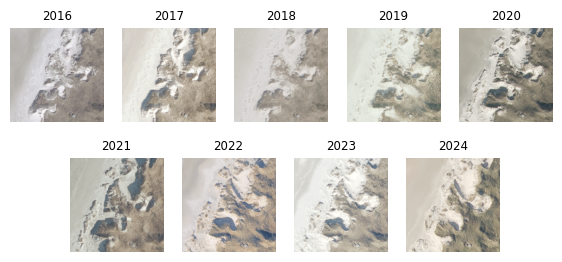

In [10]:
def get_9_orto(xmin, ymin, year):
    pixel_size = 256
    xmax = xmin + 128
    ymax = ymin + 128
    
    username = "DNBZJQDZJQ"
    password = "123dtU.456"

    wms_url = "https://services.datafordeler.dk/GeoDanmarkOrto/orto_foraar/1.0.0/WMS"
    wms_request_url = f"{wms_url}?username={username}&password={password}&SERVICE=WMS&VERSION=1.3.0&REQUEST=GetMap&BBOX={xmin},{ymin},{xmax},{ymax}&CRS=EPSG:25832&WIDTH={pixel_size}&HEIGHT={pixel_size}&STYLES=&FORMAT=image/png&DPI=96&MAP_RESOLUTION=96&FORMAT_OPTIONS=dpi:96&Layers=geodanmark_{year}_12_5cm"
    
    response = requests.get(wms_request_url)
    if response.status_code == 200:
        return Image.open(BytesIO(response.content))

# Vælg et specifikt koordinatsæt
xmin, ymin = diffusionpoints['koordinates'][47]

# Årstal der skal hentes billeder for
years = range(2016, 2025)

# Initialiser plot
fig, axes = plt.subplots(2, 5, figsize=(7, 3.1))
axes = axes.flatten()

for i, year in enumerate(years):
    img = get_9_orto(xmin, ymin, year)
    axes[i].imshow(img)
    axes[i].set_title(f"{year}", fontsize=8.5)
    axes[i].axis("off")

# Flyt den nederste række lidt til højre
offset = 0.085  # Juster hvor meget den nederste række skal rykkes
for i in range(5, 10):  # Indeks for den nederste række
    pos = axes[i].get_position()
    new_pos = [pos.x0 + offset, pos.y0, pos.width, pos.height]
    axes[i].set_position(new_pos)

# Fjern det sidste tomme plot
fig.delaxes(axes[-1])

plt.savefig('/home/jupyter-koordinat/shared/casper/illustrations/report/same_coordinate_9_years.png', dpi=300, bbox_inches='tight')
plt.show()

### Figure 5

**Sampling 5 images** 

In [55]:
model = UNet(image_size=training_config.image_size,
                 input_channels=training_config.image_channels).to('cuda')

checkpoint = torch.load('../../train/casper/output/unet256_e14.pth', map_location='cpu')
model.load_state_dict(checkpoint['model'])

diffusion_pipeline = DDPMPipeline(beta_start=1e-4, beta_end=1e-2, num_timesteps=training_config.diffusion_timesteps)

model.eval()
# Perform reverse diffusion process with noisy images.
noisy_sample = torch.randn(
    training_config.eval_batch_size,
    training_config.image_channels,
    training_config.image_size,
    training_config.image_size).to('cuda')

# Reverse diffusion for T timesteps
images = diffusion_pipeline.sampling(model, noisy_sample, device='cuda', save_all_steps=False)

/tmp/ipykernel_457615/3614742540.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('../../train/casper/output/unet256_e14.pth', map_location='cpu')

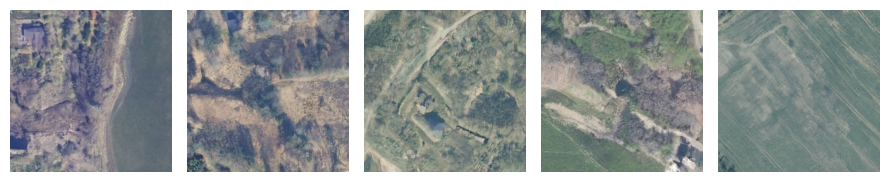

In [16]:
# Postprocess the sampled image
final_image = postprocess(images)

fig, axes = plt.subplots(1, 5, figsize=(9, 9))

for i, ax in enumerate(axes.flat):
    ax.imshow(final_image[i])
    ax.axis('off')

plt.tight_layout()
plt.savefig('/home/jupyter-koordinat/shared/casper/illustrations/report/sampling_e14', dpi=300, bbox_inches='tight')
plt.show()

**Fetching 5 training images**

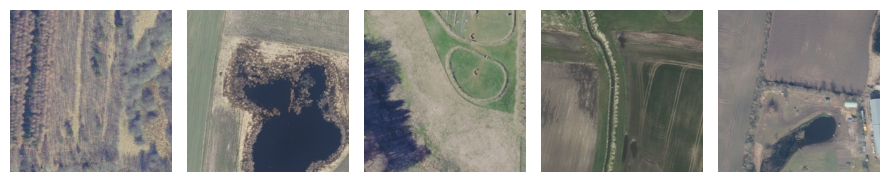

In [51]:
# Get DataLoader
loader = get_loader(training_config)

# Select 5 random coordinates
random_indices = np.random.randint(0, len(loader.dataset), 5)

# Process all selected images and store them
processed_images = [postprocess(loader.dataset[idx]["images"].unsqueeze(0))[0] for idx in random_indices]

# Create a figure for plotting
fig, axes = plt.subplots(1, 5, figsize=(9,9))

# Plot each processed image
for i, img in enumerate(processed_images):
    axes[i].imshow(img)
    axes[i].axis('off')

# Adjust layout and save/plot the figure
plt.tight_layout()
plt.savefig('/home/jupyter-koordinat/shared/casper/illustrations/report/real_images', dpi=300, bbox_inches='tight')
plt.show()

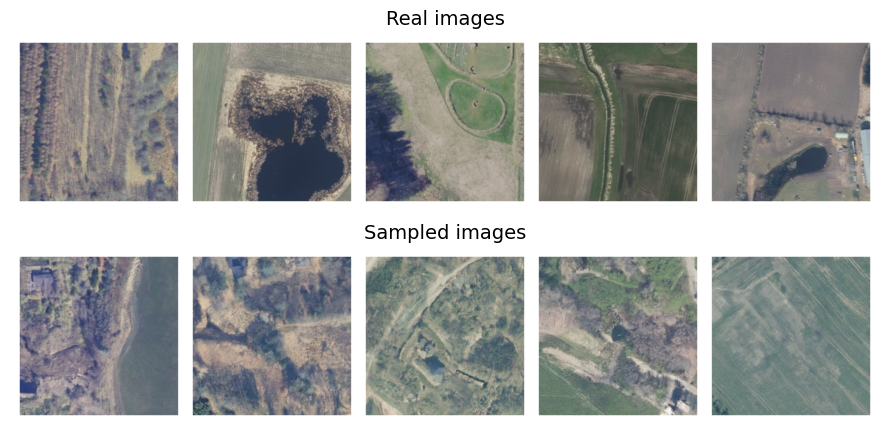

In [54]:
image1 = Image.open('/home/jupyter-koordinat/shared/casper/illustrations/report/real_images.png')
image2 = Image.open('/home/jupyter-koordinat/shared/casper/illustrations/report/sampling_e14.png')

fig, axes = plt.subplots(2, 1, figsize=(9, 4.5))

axes[0].imshow(image1)
axes[0].axis('off')  # Skjul akse
axes[0].set_title('Real images', fontsize=14)

axes[1].imshow(image2)
axes[1].axis('off')
axes[1].set_title('Sampled images', fontsize=14)

plt.tight_layout()
plt.savefig('/home/jupyter-koordinat/shared/casper/illustrations/report/samples_vs_real', dpi=300, bbox_inches='tight')
plt.show()

### Figure 4

In [9]:
model = UNet(image_size=training_config.image_size,
                 input_channels=training_config.image_channels).to('cuda')

checkpoint = torch.load('../../train/casper/output/unet256_e14.pth', map_location='cpu')
model.load_state_dict(checkpoint['model'])

diffusion_pipeline = DDPMPipeline(beta_start=1e-4, beta_end=1e-2, num_timesteps=training_config.diffusion_timesteps)

model.eval()
# Perform reverse diffusion process with noisy images.
noisy_sample = torch.randn(
    training_config.eval_batch_size,
    training_config.image_channels,
    training_config.image_size,
    training_config.image_size).to('cuda')

# Reverse diffusion for T timesteps
images = diffusion_pipeline.sampling(model, noisy_sample, device='cuda', save_all_steps=True)

/tmp/ipykernel_458893/415164223.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('../../train/casper/output/unet256_e14.pth', map_location='cpu')


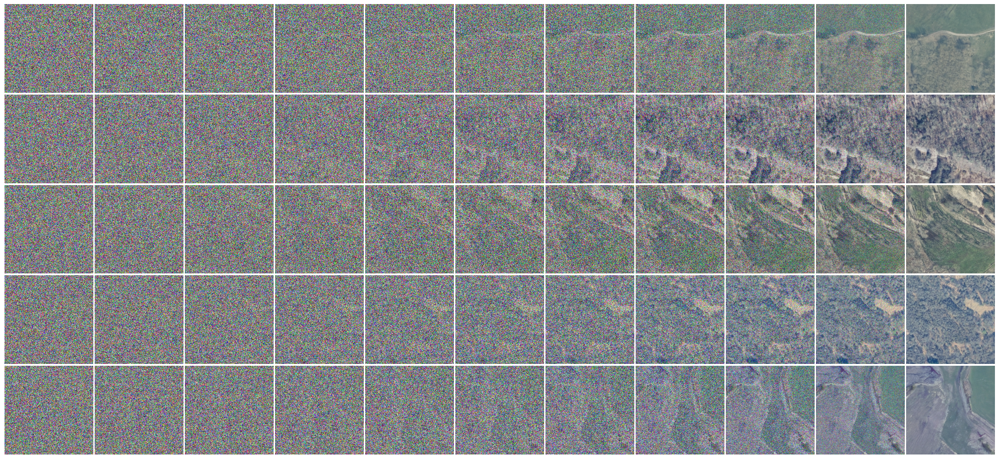

In [10]:
num_images = noisy_sample.size(0)
process_images_all = [
    [postprocess(step[image_idx].unsqueeze(0))[0] for step in images]
    for image_idx in range(num_images)
]

steps_to_plot = [0, 99, 199, 299, 399, 499, 599, 699, 799, 899, 999]
num_steps = len(steps_to_plot)

fig, axes = plt.subplots(num_images, num_steps, figsize=(num_steps * 2, num_images * 2))

if num_images == 1:
    axes = [axes]

for img_idx in range(num_images):
    for step_idx, step in enumerate(steps_to_plot):
        ax = axes[img_idx][step_idx]
        ax.imshow(process_images_all[img_idx][step])
        ax.axis('off')
        ax.margins(0, 0)
        
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0.02)
plt.savefig('/home/jupyter-koordinat/shared/casper/illustrations/report/reverse_e14', dpi=300, bbox_inches='tight')
plt.show()

## 9) FID

In [9]:
samples_dir = "../../train/casper/output/9k_samples"
train_dir = "../../train/casper/output/9k_train_images"
val_dir = "../../train/casper/output/9k_val_images"

# Count files
samples_count = len([file for file in os.listdir(samples_dir) if os.path.isfile(os.path.join(samples_dir, file))])
train_count = len([file for file in os.listdir(train_dir) if os.path.isfile(os.path.join(train_dir, file))])
val_count = len([file for file in os.listdir(val_dir) if os.path.isfile(os.path.join(val_dir, file))])

print(f"{samples_count} files in folder '{samples_dir}'.")
print(f"{train_count} files in folder '{train_dir}'.")
print(f"{val_count} files in folder '{val_dir}'.")

9000 files in folder '../../train/casper/output/9k_samples'.
9000 files in folder '../../train/casper/output/9k_train_images'.
9000 files in folder '../../train/casper/output/9k_val_images'.


In [10]:
ssl._create_default_https_context = ssl._create_unverified_context

samples_dir = "../../train/casper/output/9k_samples"
train_dir = "../../train/casper/output/9k_train_images"
val_dir = "../../train/casper/output/9k_val_images"

# Calculate FID score
fid_value_samples_train = fid_score.calculate_fid_given_paths([samples_dir, train_dir], batch_size=1, device="cuda", dims=2048)
fid_value_samples_val = fid_score.calculate_fid_given_paths([samples_dir, val_dir], batch_size=1, device="cuda", dims=2048)
fid_value_train_val = fid_score.calculate_fid_given_paths([train_dir, val_dir], batch_size=1, device="cuda", dims=2048)

# Print FID score
print(f"FID score (samples and train): {fid_value_samples_train:.4f}")
print(f"FID score (samples and val): {fid_value_samples_val:.4f}")
print(f"FID score (train and val): {fid_value_train_val:.4f}")

100%|██████████| 9000/9000 [01:25<00:00, 105.76it/s]


FID score (samples and train): 92.1106
FID score (samples and val): 90.8707
FID score (train and val): 5.6886
